# Plot polar maps of boreal domain data 
Paul Montesano  
Fall 2022  
run this notebook in a conda R env

In [3]:
#system("conda activate r-with-gdal")

In [1]:
library(aws.s3)
#library(rgdal)
library(raster)
library(tidyverse)
library(dplyr)
library(grid)
library(gridExtra)
library(RColorBrewer)
library(data.table)

library(fs)
library(sf)
#library(rgdal)

library(rgeos)
library(mapproj)
#library(rgee)
library(viridis)
#library(wesanderson)
library(scales)
library(tools)
library(patchwork)

library(rnaturalearth)
library(rnaturalearthdata)
#library(feather)

#conda install -c conda-forge r-rnaturalearth r-rnaturalearthdata r-mapproj r-rgeos r-viridis r-wesanderson r-patchwork r-aws.s3 r-feather r-rockchalk

Loading required package: sp

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.4     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ tidyr::extract() masks raster::extract()
✖ dplyr::filter()  masks stats::filter()
✖ dplyr::lag()     masks stats::lag()
✖ dplyr::select()  masks raster::select()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine



Attaching package: ‘data.table’


The following objects are masked from ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year


The following objects are masked from ‘package:dplyr’:

    between, first, 

# Paths of final tindex master files

In [2]:
# This is the final list of HLS tiles that include the fixed (45) tiles
hls_params_fn = "s3://maap-ops-workspace/shared/montesano/DPS_tile_lists/HLS/2020/HLS_stack_2023_v1/HLS_input_params.csv"

# Replace this with final
#AGB_tindex_master_fn = "s3://maap-ops-workspace/shared/nathanmthomas/DPS_tile_lists/AGB/fall2022/map_boreal_2022_v3/11/AGB_tindex_master.csv"
#AGB_tindex_master_fn = "s3://maap-ops-workspace/shared/nathanmthomas/DPS_tile_lists/AGB/winter2023/map_boreal_2022_rh_noground_v4/AGB_tindex_master.csv"
# Final file
AGB_tindex_master_fn = "s3://maap-ops-workspace/shared/nathanmthomas/DPS_tile_lists/AGB/c2020/map_boreal_2022_rh_noground_v4/AGB_tindex_master.csv"

# Final file
ATL08_filt_tindex_master_fn = "s3://maap-ops-workspace/shared/lduncanson/DPS_tile_lists/fall2022/with_atl03_rh/ATL08_filt_tindex_master.csv"

## Set output figure dir.

In [3]:
MAINDIR = '/projects/my-public-bucket/boreal_HLS_ATL08_metadata'
OUT_FIGURE_DIR = paste0(MAINDIR, '/paper_figs')
OUT_DATA_DIR = paste0(MAINDIR, '/data')

### Mapping functions and vars

In [4]:
source('/projects/code/3dsi/boreal_map_functions.R') 

[1] "MAAP"
[1] "MAAP"


#### Note: the ability to make these maps is changing...

The use of type 'SpatialPolygons' will go away.  
This means 'crop' will need to be changed to crop an 'sf' object.

But the whole polar mapping function is built around the use of 'SP', not 'sf'.-  

THis will need work and testing to be able to reproduce these polar maps.

At the moment, these still works in `r-env-3.6.3` on Prism

In [5]:
# Circ map new: trying to combine the best of the sf and sp approaches
DO_MAP_BOREAL_SP <- function( MAP_EXTENT = extent(-180,180,45,90), xlim=NULL, ylim=NULL, rotate_map=0, proj_name = 'azequalarea', LAYER_LIST=NULL, 
                             BOREAL_SHP_FN = '/projects/my-public-bucket/misc_files/Ecoregions2017_boreal_m.shp'){
  #
  # Map with a polar projection
  #
  
  # Color scale help
  #https://biostats.w.uib.no/color-scale-for-continuous-variables/
  
  #source(path("C:\\Users\\pmontesa\\Google Drive\\Work\\R","plot_functions.R"))
  # Shapefiles
  
  
  #world <- crop(ne_countries(scale = "medium", returnclass = "sp"), MAP_EXTENT)
  world <- raster::crop(as(ne_countries(scale = "medium", returnclass = "sf"), 'Spatial'), MAP_EXTENT)
  #world = st_crop(x = ne_countries(scale = "medium", returnclass = "sf") %>% st_make_valid() ,  y = ext)
  
  # WWF
  #boreal <- shp_fort_join("D:\\databank\\wwf\\arc\\wwf_circumboreal_Dissolve.shp", MAP_EXTENT, REPROJECT = TRUE)
  # TerraPulse
  boreal <- shp_fort_join(boreal_shp_fn, MAP_EXTENT, REPROJECT = TRUE)
  
  map_list_base = list(
    
    geom_polygon(data = fortify(world), aes(x = long, y = lat, group = group), fill="grey90", color=NA),
    geom_polygon(data = boreal, aes(x = long, y = lat, group = group), color=NA, fill="grey70"))
    
  map_list_top = list(
    
    geom_polygon(data = fortify(world), aes(x = long, y = lat, group = group), fill=NA, color="black", size=0.1 ),
    
    theme_minimal() , 
    theme(axis.text = element_blank(), axis.title = element_blank() ) ,
    
    #geom_polygon(data = fortify(continents.df_stereo), aes(x = long, y = lat, group = group), fill = NULL, colour = "black", size=0.25) +
    #scale_color_distiller(palette = "Greens", direction = 1, name = "%"),
    #scale_color_manual(values = COLOR_PAL, name = map_str) ,
    guides(guide = guide_legend(direction = "horizontal", nrow=1, label.position = "bottom", title.position = "bottom") ) ,
    theme(legend.position="top",
          legend.title = element_text(size=9),
          #       legend.direction  = 'vertical',
          legend.key.width  = unit(1.0, "cm"),
          legend.key.height = unit(.25, "cm")  )
  )
  
  if(is.null(LAYER_LIST)){
    map_list = list(
      map_list_base,
      map_list_top
    )
  }else{
    map_list = list(
      map_list_base,
      LAYER_LIST,
      map_list_top
    )
  }
  
  p_map = ggplot() + map_list +
    #coord_map_stereo_list(proj_name = proj_name, min_lat = MAP_EXTENT[3], rotation=rotate_map, xlim = xlim, ylim = ylim)
    coord_map_stereo_list(proj_name = proj_name, min_lat = MAP_EXTENT[3], rotation=rotate_map)
  
  if(FALSE){
    out_plot_fn = paste0("D:/projects/3dsi/plots/map_boreal_",proj_name,"_", format(Sys.time(), "_%Y%m%d"),'.png')
    print(out_plot_fn)
    ggsave(plot = p_map ,
           file = out_plot_fn,
           device = 'png', dpi = 300, width = 5, height = 5)
  }
  #print(p_map)
  return(p_map)
  
}

coord_map_stereo_list <- function(proj_name = "stereo", rotation = 0, min_lat = 50, xlims=NULL, ylims=NULL, LABEL_SIZE=3){ 
  
  # Defines the x axes required
  lat_lines = seq(min_lat+10, 80, by = 10)
  lat_labs = paste0(seq(min_lat+10, 80, by = 10), "\u00B0N")
  
  lon_lines = seq(0, 330, by = 30)
  lon_labs = c("0", paste0(seq(30, 150, by = 30), "°E"), "180", rev(paste0(seq(30, 150, by = 30), "°W")))
  
  
  return(list(
    # Convert to polar coordinates
    coord_map(proj_name, orientation = c(90, 0, rotation, xlims=xlims, ylims=ylims)), #"ortho""
    scale_y_continuous(breaks = seq(45, 90, by = 5), labels = NULL),
    
    # Removes Axes and labels
    scale_x_continuous(breaks = NULL),
    xlab(""),
    ylab(""),
    
    # Adds axes
    # Latitude
    geom_hline(aes(yintercept = lat_lines), size = 0.25, color = "grey80", linetype = "dotted"),
    # Outer circular border
    geom_hline(aes(yintercept = min_lat), size = 0.25), #1
    # Longitude
    geom_vline(aes(xintercept = lon_lines), size = 0.25, color = "grey80", linetype = "dotted"),
    #geom_segment(aes(y = 45, yend = 85, x = x_lines, xend = x_lines), linetype = "dotted") +
    
    # Adds labels
    #geom_text(aes(x = 0, y = lat_lines, hjust = 0.5, label = lat_labs)),
    geom_label(aes(x = 0, y = lat_lines, label = lat_labs), label.size = NA, size=LABEL_SIZE, color = "black", fill="white", label.padding=unit(0.1,"lines")),
    #geom_text(aes(x = lon_lines, y = min_lat-3, hjust = 0.5, vjust = 0.5, label = lon_labs), size = 2.5), #hjust = 0.5
    # min-3 so lon labels are centered over outer line
    geom_label(aes(x = lon_lines, y = min_lat-3, label = lon_labs), label.size = NA,  hjust='inward', vjust='inward', size = LABEL_SIZE, color = "black", fill="white", label.padding=unit(0.1,"lines")),  #y = min_lat-3 why used to be this?
    
    ##guides(fill=FALSE)+
    
    # Change theme to remove axes and ticks
    theme(panel.background = element_blank(),
          #panel.grid = element_line(size = 0.25, linetype = 'dotted', colour = "grey50"),
          axis.ticks=element_blank())
    #,
    #labs(caption = "Source: circ_tte_map.Rmd")
  ))
}  

gridCreate<-function(shp, res,proj_out, buffer=10000){
  
  if (!is.null(buffer)){
    shp<-buffer(shp, width=buffer)
  }
  ext <- floor(extent(shp))
  rr <- raster(ext, res=res)
  rr <- rasterize(shp, rr, field=1)
  rr[!is.na(rr[])]<-1:length(rr[!is.na(rr[])])
  grid<-rasterToPolygons(rr)
  crs(grid)<-projection(shp)
  if (!proj_out==projection(shp)){
    grid<-spTransform(grid,CRS(proj_out))
  }
  return(grid)  
}



In [6]:
crs_canalb = "+proj=aea +lat_0=40 +lon_0=180 +lat_1=50 +lat_2=70 +x_0=0 +y_0=0 +datum=NAD83 +units=m +no_defs"
crs_albers = "+proj=aea +lat_1=50 +lat_2=70 +lat_0=40 +lon_0=180 +x_0=0 +y_0=0 +ellps=GRS80 +datum=NAD83 +units=m +no_defs"
crs_gcs = "+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs"

### Get Boreal EXTENT

#### Read boreal extent, read tiles, then clip tiles to boreal extent

In [7]:
boreal_shp_fn = '/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson'
boreal = st_read(boreal_shp_fn)
boreal_albers<-spTransform(sf:::as_Spatial(boreal),CRS(crs_albers))

Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


#### Get all tiles delivered to DAAC for this project

In [8]:
boreal_tile_DAAC_path = '/projects/shared-buckets/montesano/databank/daac/boreal_tiles_v004_AGB_H30_2020_ORNLDAAC.gpkg'
boreal_tiles_gcs_DAAC = st_read(boreal_tile_DAAC_path) %>% st_transform(4326)
boreal_tile_num_DAAC_list =  boreal_tiles_gcs_DAAC %>% as.data.frame() %>% dplyr::select(tile_num) %>% as.list()
boreal_tile_num_DAAC_list = unlist(boreal_tile_num_DAAC_list[[1]])
length(boreal_tile_num_DAAC_list)

Reading layer `boreal_tiles_v004_AGB_H30_2020_ORNLDAAC' from data source 
  `/projects/shared-buckets/montesano/databank/daac/boreal_tiles_v004_AGB_H30_2020_ORNLDAAC.gpkg' 
  using driver `GPKG'
Simple feature collection with 3907 features and 2 fields
Geometry type: POLYGON
Dimension:     XY
Bounding box:  xmin: -180 ymin: 43.75195 xmax: 180 ymax: 78.53133
Geodetic CRS:  WGS 84


[1] 3907

In [9]:
boreal_tiles_gcs_ATL08obs_df = fortify_sf(boreal_tiles_gcs_ATL08obs)

ERROR: Error in as_Spatial(sf): object 'boreal_tiles_gcs_ATL08obs' not found


#### Clip tiles to Boreal EXTENT

In [5]:
# boreal_tile_index_path = '/projects/shared-buckets/montesano/databank/boreal_tiles_v004.gpkg'
# boreal_tiles_clip = st_intersection(
#                                 st_read(boreal_tile_index_path) %>% st_transform(crs="+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs"), 
#                                 boreal)#%>% as.data.frame()

## Map showing boreal tile extent

In [10]:
ext = extent(-180,180,45,90)

In [11]:
#boreal_tiles_gcs = shp_fort_join(boreal_tile_index_path, ext, REPROJECT=TRUE)

[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Warning message:
“`fortify(<SpatialPolygonsDataFrame>)` was deprecated in ggplot2 3.4.4.
ℹ Please migrate to sf.”
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
Regions defined for each Polygons


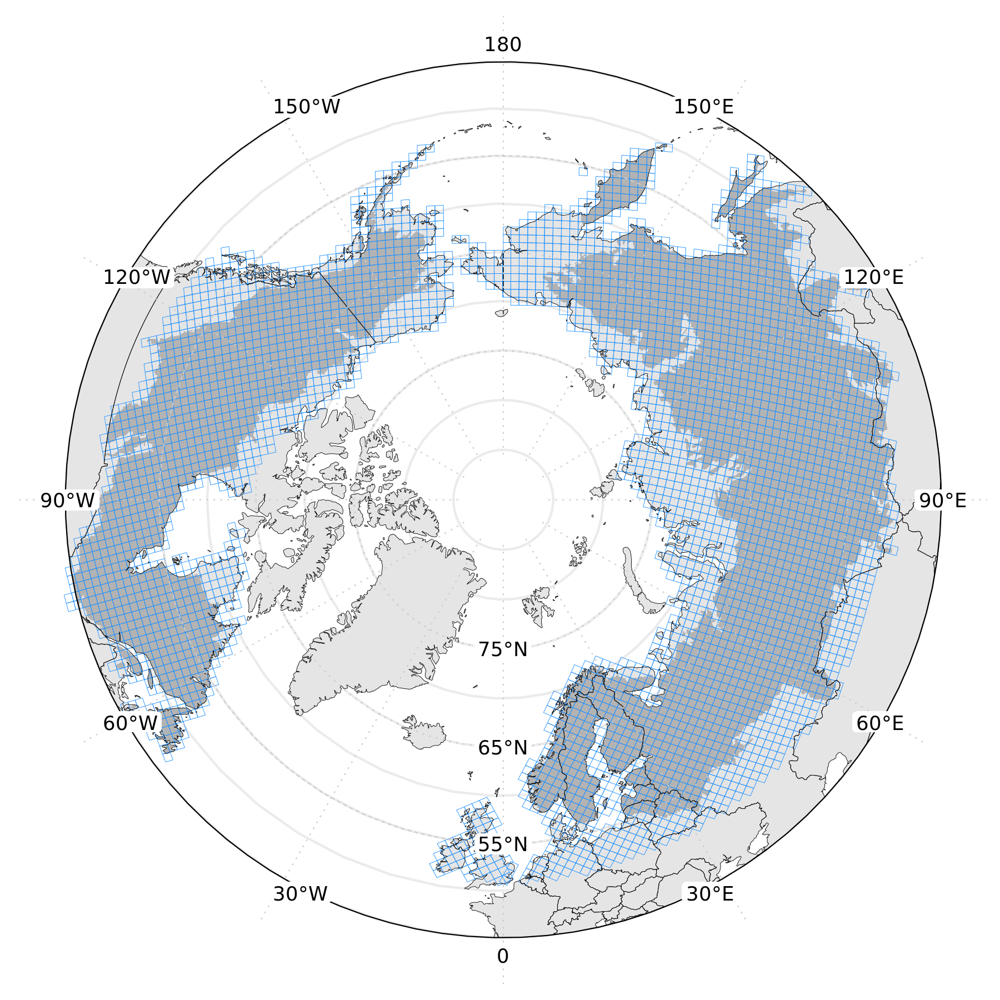

In [12]:
options(repr.plot.width = 6, repr.plot.height = 6, repr.plot.res = 300)

m_boreal_tiles = DO_MAP_BOREAL_SP(MAP_EXTENT=extent(-180,180,45,90),  
                     BOREAL_SHP_FN = wwf_circ_dis_fn,
                     LAYER_LIST = list(geom_polygon(data = fortify_sf(boreal_tiles_gcs_DAAC %>% dplyr::filter(tile_num %in% boreal_tile_num_DAAC_list)), 
                                                    aes(x = long, y = lat, group = group), size=0.1, fill=NA, color='dodger blue')) #, fill=NA
                    ) + 
    theme(legend.text=element_text(size=rel(0.5))) #+
    #scale_color_brewer(palette = 'Set2') +
    #scale_fill_viridis_d() +
    #guides(fill=guide_legend(title="Tile groups", title.position = "top", label.position = "bottom", keywidth = unit(.5, "cm"), keyheight = unit(.25, "cm"), nrow=2))
m_boreal_tiles

## Export figure: DAAC tiles - all tiles for c2020 map

In [55]:
DATA_NAME_STEM = "boreal_tiles_DAAC"
EXPORT_TIME_STR = format(Sys.time(), "_%Y%m%d")

for(OUT_TYPE in c('png', 'pdf')){
    map_fn = path(OUT_FIGURE_DIR, paste0("map_",DATA_NAME_STEM,"_", EXPORT_TIME_STR,".", OUT_TYPE))
    print(map_fn)
    ggsave(plot = m_boreal_tiles,
           file = map_fn,
           device = OUT_TYPE, dpi = 300, width = 8, height = 15)
}

/projects/my-public-bucket/boreal_polar_map/paper_figs/map_boreal_tiles_DAAC__20230706.png
/projects/my-public-bucket/boreal_polar_map/paper_figs/map_boreal_tiles_DAAC__20230706.pdf


## Map HLS metadata (# scenes , compositing params)

### Read all HLS input params tables and append

In [13]:
# This is the final list of HLS tiles that include the fixed (45) tiles
Sys.setenv("AWS_DEFAULT_REGION" = "us-west-2")

df_list = list()
for(YEAR in seq(2016,2024) ){
    
    # Read rom s3
    hls_params <- aws.s3::s3read_using(read.csv, object = paste0('s3://maap-ops-workspace/shared/montesano/DPS_tile_lists/HLS/HLS_stack_2023_v1/HLS_H30_',YEAR,'/HLS_input_params.csv'))

    boreal_tiles_gcs_DAAC_HLS = boreal_tiles_gcs_DAAC %>% 
        dplyr::mutate(tile_num = as.numeric(tile_num)) %>% 
        dplyr::left_join(hls_params, by = c('tile_num' = 'tile_num')) %>%
        unite(HLS_run_name, c("max_cloud","start_month_day","end_month_day"),sep = "\n", remove = FALSE) %>%
        mutate(year = YEAR)
    
    df_list[[YEAR]] = boreal_tiles_gcs_DAAC_HLS
}
boreal_tiles_gcs_DAAC_HLS_all = do.call('rbind', df_list)

In [14]:
head(boreal_tiles_gcs_DAAC_HLS_all, 2)

Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson



,tile_num,s3_path,X,HLS_run_name,max_cloud,start_month_day,end_month_day,start_year,end_year,json_path,num_scenes,run_type,year,geom
,<dbl>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<int>,<POLYGON [°]>
1,4308,s3://maap-ops-workspace/lduncanson/dps_output/run_boreal_biomass_map/boreal_agb_2024_v6/AGB_H30_2020/Version2_SD/2024/07/17/10/30/12/581227/boreal_agb_2020_202407171721237382_0004308.tif,3742,90 07-01 08-31,90,07-01,08-31,2016,2016,s3://maap-ops-workspace/montesano/dps_output/do_HLS_stack_3-1-2/HLS_stack_2023_v1/HLS_H30_2016/mc90_07-01_08-31_2016_2016/2023/07/21/20/01/48/633561/output-2023-07-21T20:01:48.633561.context.json,20,90_07-01_08-31_2016_2016,2016,POLYGON ((-152.6655 56.2629...
2,4344,s3://maap-ops-workspace/lduncanson/dps_output/run_boreal_biomass_map/boreal_agb_2024_v6/AGB_H30_2020/Version2_SD/2024/07/17/10/33/29/740129/boreal_agb_2020_202407171721237578_0004344.tif,761,90 07-01 08-31,90,07-01,08-31,2016,2016,s3://maap-ops-workspace/montesano/dps_output/do_HLS_stack_3-1-2/HLS_stack_2023_v1/HLS_H30_2016/mc90_07-01_08-31_2016_2016/2023/07/21/15/45/26/143901/output-2023-07-21T15:45:26.143901.context.json,39,90_07-01_08-31_2016_2016,2016,POLYGON ((-154.574 55.83034...


## Map HLS metadata

## Read in HLS yearly metadata gpkg files built in `HLS_metadata.ipynb` - HLS params for all years

In [41]:
YEAR_LIST = c('2024','2023','2022','2021','2020', '2019')

In [42]:
hls_year_scenes_list = list()
for(YEAR in YEAR_LIST){
    hls_year_scenes_list[[YEAR]] = st_read(paste0(OUT_DATA_DIR, paste0('/HLS_year_scenes_metadata_',YEAR,'.gpkg')) )
    }

Reading layer `HLS_year_scenes_metadata_2024' from data source 
  `/projects/my-public-bucket/boreal_HLS_ATL08_metadata/data/HLS_year_scenes_metadata_2024.gpkg' 
  using driver `GPKG'
Simple feature collection with 78093 features and 14 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -180 ymin: 35.11017 xmax: 180 ymax: 79.26921
Geodetic CRS:  WGS 84
Reading layer `HLS_year_scenes_metadata_2023' from data source 
  `/projects/my-public-bucket/boreal_HLS_ATL08_metadata/data/HLS_year_scenes_metadata_2023.gpkg' 
  using driver `GPKG'
Simple feature collection with 168187 features and 14 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -180 ymin: 35.11017 xmax: 180 ymax: 79.26921
Geodetic CRS:  WGS 84
Reading layer `HLS_year_scenes_metadata_2022' from data source 
  `/projects/my-public-bucket/boreal_HLS_ATL08_metadata/data/HLS_year_scenes_metadata_2022.gpkg' 
  using driver `GPKG'
Simple feature collection with 129365 features and 14 field

In [47]:
hls_year_scenes = do.call(rbind, hls_year_scenes_list)

In [48]:
length(unique(hls_year_scenes$id))

[1] 575117

In [49]:
smry = hls_year_scenes %>% as.data.frame() %>% group_by(year) %>%
    summarize(
    HLS_scenes = n()
    )
smry

year,HLS_scenes
<int>,<int>
2019,73225
2020,64459
2021,61828
2022,129365
2023,168167
2024,78093


In [50]:
map_theme = list(
                theme(legend.text=element_text(size=rel(0.35))),
                guides(fill=guide_colourbar(
                    #title=expression("# of filtered "~HLS[H30]~"scenes in composite"), 
                    title="# of filtered HLS[H30] scenes",
                    title.position = "top", label.position = "bottom"
                                           # , keywidth = unit(4, "cm"), keyheight = unit(.25, "cm")
                               )
                ),
                scale_fill_viridis(option = 'turbo' 
                                   , breaks=c(0,50,100,150)
                                   , limits = c(0, 170)
                                   , labels=comma
                                  #, trans='log'
                                  )
)

In [51]:
levels(factor(boreal_tiles_gcs_DAAC_HLS_all$year))

[1] "2016" "2017" "2018" "2019" "2020" "2021" "2022" "2023" "2024"

In [52]:
options(repr.plot.width = 6, repr.plot.height = 6, repr.plot.res = 300)

map_list = list()

for(i in seq_along(levels(factor(boreal_tiles_gcs_DAAC_HLS_all$year))) ){
    
    YEAR = levels(factor(boreal_tiles_gcs_DAAC_HLS_all$year))[i]
    
    HLSobs_LAYER_LIST = list(
                            geom_polygon(data = fortify_sf(boreal_tiles_gcs_DAAC_HLS_all  %>% filter(year == YEAR)), 
                                                        aes(x = long, y = lat, group = group, fill=num_scenes), size=0.1)
                            , map_theme
                            , labs(title=YEAR, subtitle = paste0("n = ", scales::label_comma(accuracy=1)(smry[which(smry$year == YEAR), ]$HLS_scenes)) ) #<-- use output from HLS_metadata.ipynb where you summaryize by HLS id and count scenes for each year
                            )
    
    map_list[[YEAR]] = DO_MAP_BOREAL_SP(MAP_EXTENT=extent(-180,180,45,90),  
                         BOREAL_SHP_FN = wwf_circ_dis_fn,
                         LAYER_LIST = HLSobs_LAYER_LIST)
}

Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


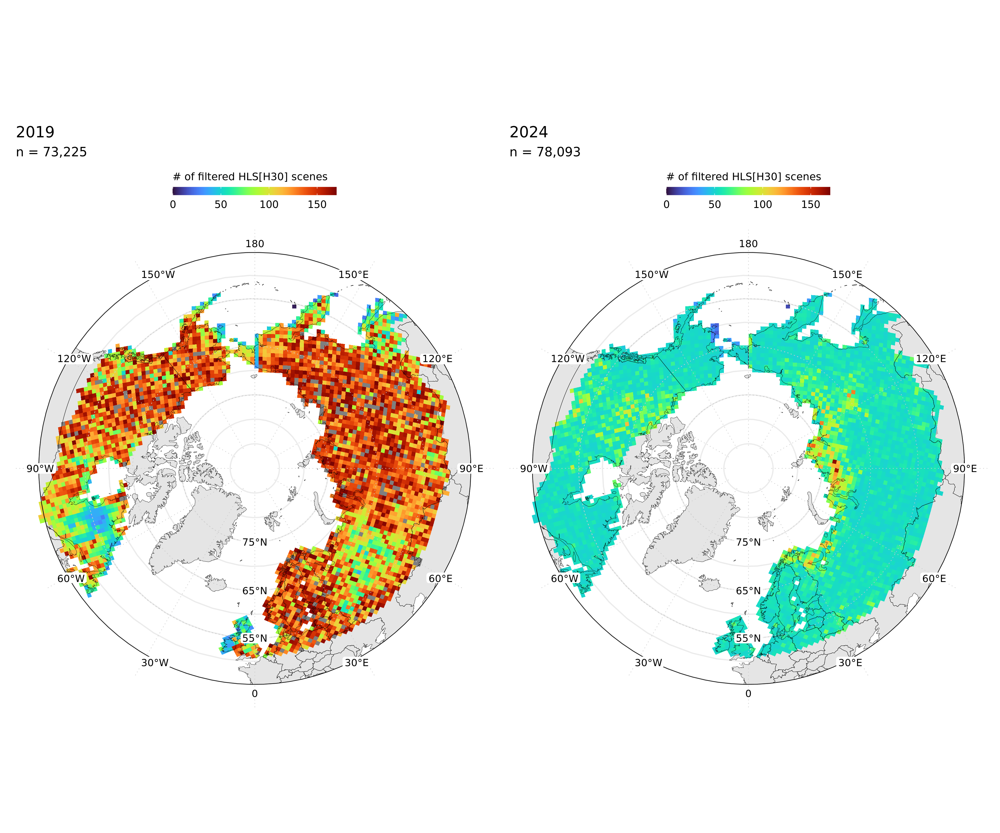

In [53]:
options(repr.plot.width = 12, repr.plot.height = 10, repr.plot.res = 300)

map_list[['2019']] | map_list[['2024']]

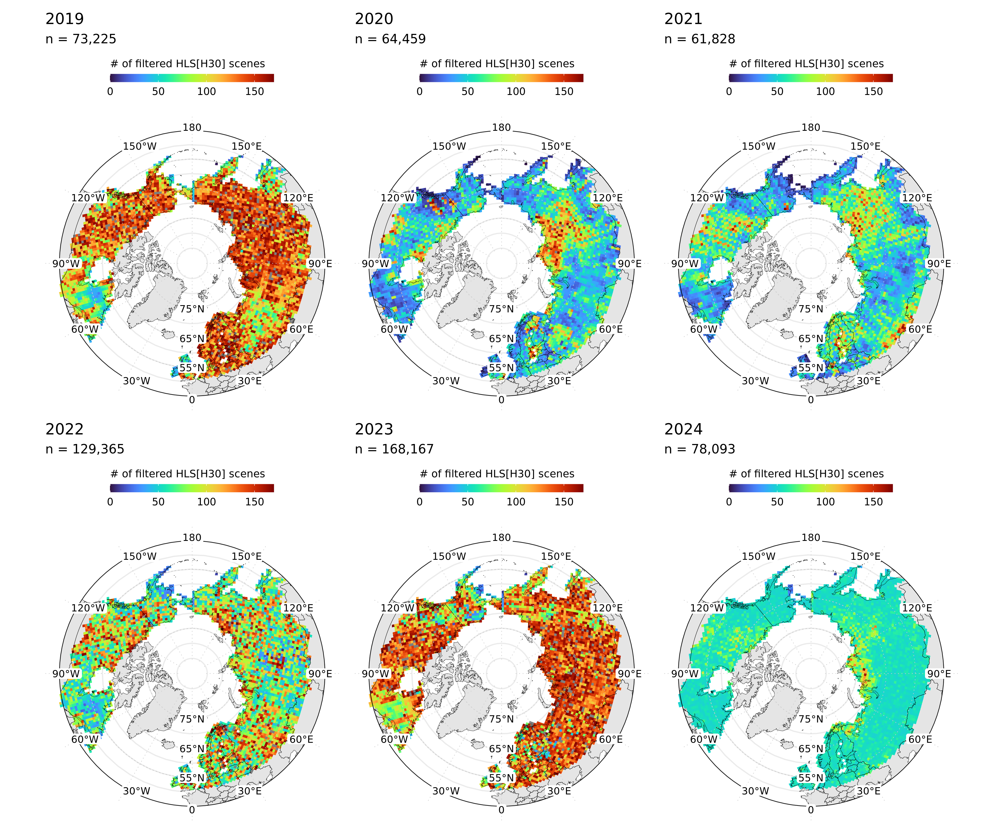

In [54]:
options(repr.plot.width = 12, repr.plot.height = 10, repr.plot.res = 300)

(
    (map_list[['2019']] | map_list[['2020']] | map_list[['2021']] ) /
    (map_list[['2022']] | map_list[['2023']] | map_list[['2024']] ) 
    #+ plot_annotation(tag_levels = "a") 
 ) #+ plot_layout(guides = "collect")

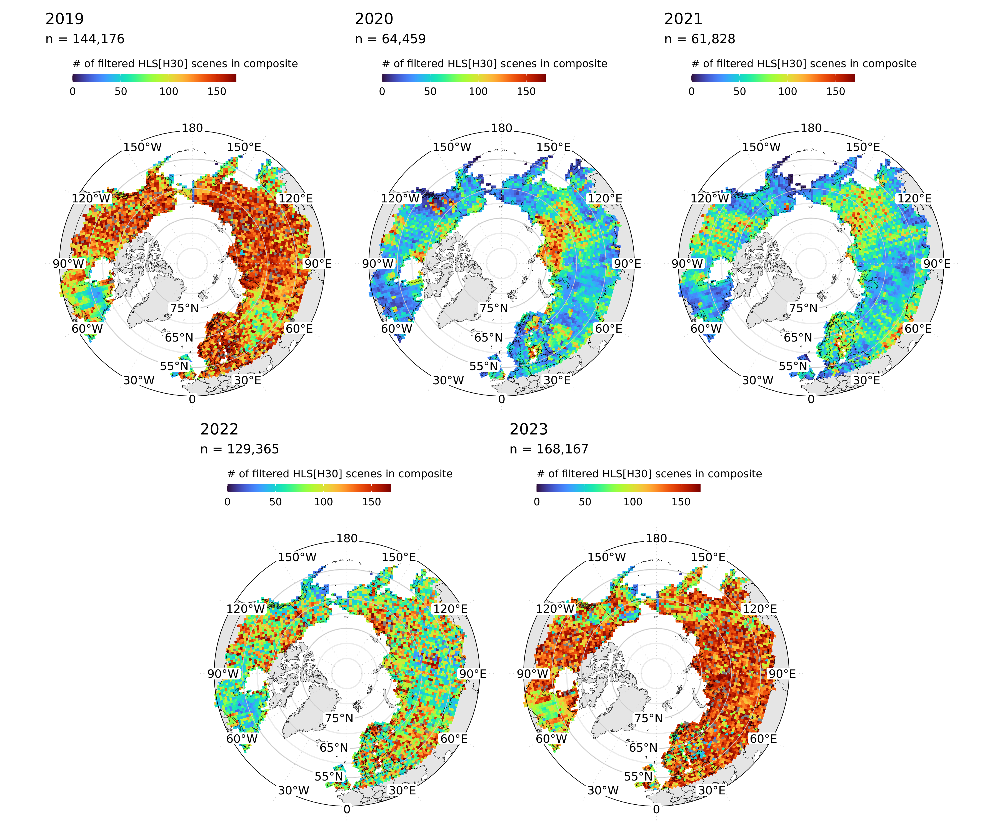

In [207]:
options(repr.plot.width = 12, repr.plot.height = 10, repr.plot.res = 300)

(
    (map_list[['2019']] | map_list[['2020']] | map_list[['2021']] ) /
    (map_list[['2022']] | map_list[['2023']] ) 
    #+ plot_annotation(tag_levels = "a") 
 ) #+ plot_layout(guides = "collect")

## Export figure:

In [91]:
DATA_NAME_STEM = "boreal_tiles_DAAC_num_HLS_scenes"
EXPORT_TIME_STR = format(Sys.time(), "_%Y%m%d")

for(OUT_TYPE in c('png', 'pdf')){
    map_fn = path(OUT_FIGURE_DIR, paste0("map_",DATA_NAME_STEM,"_", EXPORT_TIME_STR,".", OUT_TYPE))
    print(map_fn)
    ggsave(plot = m_boreal_tiles_HLS,
           file = map_fn,
           device = OUT_TYPE, dpi = 300, width = 8, height = 15)
}

/projects/my-public-bucket/boreal_polar_map/paper_figs/map_boreal_tiles_DAAC_num_HLS_scenes__20230706.png
/projects/my-public-bucket/boreal_polar_map/paper_figs/map_boreal_tiles_DAAC_num_HLS_scenes__20230706.pdf


## Read in table built in `HLS_metadata.ipynb` - HLS params for all years

In [55]:
hls_params_all_df = read_csv(paste0(OUT_DATA_DIR, '/HLS_params_all_years.csv'))

New names:
• `` -> `...1`
Rows: 51478 Columns: 12
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (5): start_month_day, end_month_day, json_path, run_type, temporal_window
dbl (7): ...1, Unnamed: 0, tile_num, max_cloud, start_year, end_year, num_sc...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


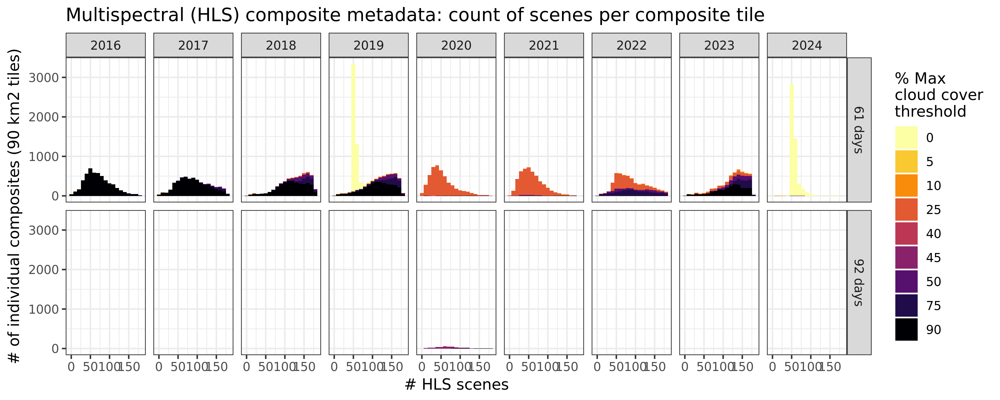

In [56]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 300)

ggplot(data = hls_params_all_df)+ 
    geom_histogram(aes(x=num_scenes, fill=factor(max_cloud)), binwidth=10) +
    #+ scale_fill_cmap_d(cmap_name ='inferno_r', name='% cloud cover\n[max, HLS scene]')+ 
    scale_fill_viridis_d(option = 3, direction = -1) + 
    #+ facet_grid('~end')
    theme_bw() +
    labs(title='Multispectral (HLS) composite metadata: count of scenes per composite tile', x='# HLS scenes', y='# of individual composites (90 km2 tiles)', fill='% Max\ncloud cover\nthreshold') + 
    facet_grid('temporal_window~end_year')

## Read in table built in `HLS_metadata.ipynb` - HLS year scenes metadata

In [57]:
smry_hls_year_scenes_df = read_csv(paste0(OUT_DATA_DIR, '/HLS_year_scenes_metadata_smry.csv'))

New names:
• `` -> `...1`
Rows: 40 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): collection_type, collection
dbl  (5): ...1, year, month, count, cloud_cover_median
date (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [58]:
head(smry_hls_year_scenes_df)

...1,year,month,collection_type,count,cloud_cover_median,start,end,collection
<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<date>,<date>,<chr>
0,2016,7,L30,20959,47,2016-07-01,2016-08-31,HLSL30.v2.0
1,2016,7,S30,16898,46,2016-07-01,2016-08-31,HLSS30.v2.0
2,2016,8,L30,20077,41,2016-07-01,2016-08-31,HLSL30_2.0
3,2016,8,S30,17694,43,2016-07-01,2016-08-31,HLSS30.v2.0
4,2017,7,L30,21854,41,2017-07-01,2017-08-31,HLSL30.v2.0
5,2017,7,S30,33025,44,2017-07-01,2017-08-31,HLSS30.v2.0


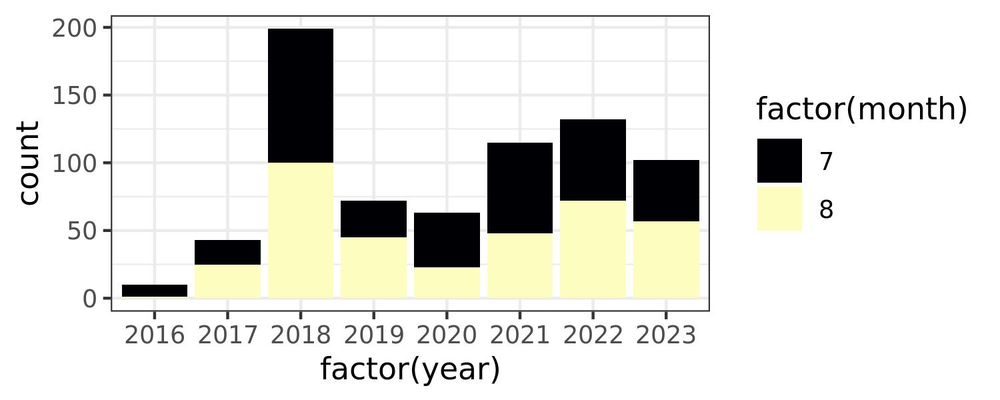

In [146]:
options(repr.plot.width = 5, repr.plot.height = 2, repr.plot.res = 300)

ggplot(smry_hls_year_scenes_df) +
    geom_col(aes(x=factor(year), y=count, fill=factor(month))) +
    scale_fill_viridis_d(option=1) +
    theme_bw()

In [182]:
scales::label_comma(accuracy=1)(sum(smry$HLS_scenes))

[1] "567,995"

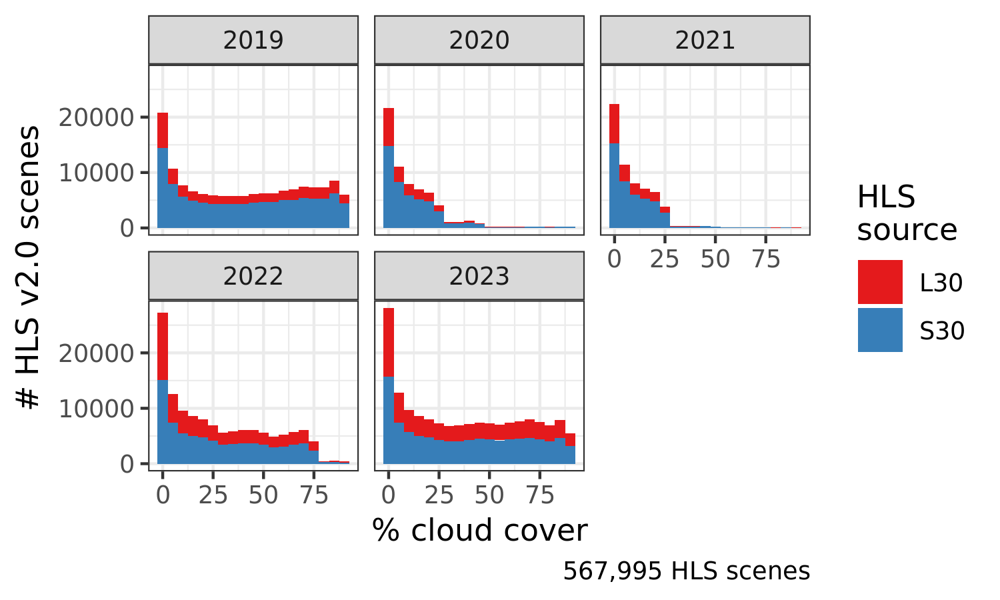

In [189]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 300)

ggplot(data = hls_year_scenes) + 
    geom_histogram(aes(x=properties.eo.cloud_cover, fill=factor(collection_type)),  position = position_stack() , binwidth=5)+
    #scale_fill_viridis_d(option=2)+
    scale_fill_brewer(palette=6, type='qual', name='HLS\nsource') +
    labs(
        #fill='Month of\nacquisition\n', 
        y='# HLS v2.0 scenes', x='% cloud cover', caption=paste0(scales::label_comma(accuracy=1)(sum(smry$HLS_scenes))," HLS scenes") )+
    facet_wrap('. ~ year', ncol=3)+
    #+ geom_label(x=75, y=0, aes(label)
    theme_bw()
    #+ theme(figure_size=(6.5, 3), axis_text_x=element_text(angle=90))  

## Map HLS compositing params

In [237]:
head(boreal_tiles_gcs_DAAC_HLS_all, 2)

,tile_num,s3_path,X,HLS_run_name,max_cloud,start_month_day,end_month_day,start_year,end_year,json_path,num_scenes,run_type,year,geom
,<dbl>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<int>,<POLYGON [°]>
1,4308,s3://maap-ops-workspace/lduncanson/dps_output/run_boreal_biomass_map/boreal_agb_2024_v6/AGB_H30_2020/Version2_SD/2024/07/17/10/30/12/581227/boreal_agb_2020_202407171721237382_0004308.tif,3742,90 07-01 08-31,90,07-01,08-31,2016,2016,s3://maap-ops-workspace/montesano/dps_output/do_HLS_stack_3-1-2/HLS_stack_2023_v1/HLS_H30_2016/mc90_07-01_08-31_2016_2016/2023/07/21/20/01/48/633561/output-2023-07-21T20:01:48.633561.context.json,20,90_07-01_08-31_2016_2016,2016,POLYGON ((-152.6655 56.2629...
2,4344,s3://maap-ops-workspace/lduncanson/dps_output/run_boreal_biomass_map/boreal_agb_2024_v6/AGB_H30_2020/Version2_SD/2024/07/17/10/33/29/740129/boreal_agb_2020_202407171721237578_0004344.tif,761,90 07-01 08-31,90,07-01,08-31,2016,2016,s3://maap-ops-workspace/montesano/dps_output/do_HLS_stack_3-1-2/HLS_stack_2023_v1/HLS_H30_2016/mc90_07-01_08-31_2016_2016/2023/07/21/15/45/26/143901/output-2023-07-21T15:45:26.143901.context.json,39,90_07-01_08-31_2016_2016,2016,POLYGON ((-154.574 55.83034...


In [228]:
# #hls_params = read.csv("/projects/shared-buckets/nathanmthomas/DPS_tile_lists/HLS_test_redo/spring2022/HLS_input_params.csv")
#hls_params_fn = read.csv("/projects/shared-buckets/nathanmthomas/DPS_tile_lists/HLS/fall2022/HLS_stack_2022_v2/HLS_input_params.csv")

# No longer needed - we read hls_params_all_df above

if(FALSE){
    # This is the final list of HLS tiles that include the fixed (45) tiles
    Sys.setenv("AWS_DEFAULT_REGION" = "us-west-2") 
    # Read rom s3
    hls_params_all_df <- aws.s3::s3read_using(read.csv, object = hls_params_fn)
}

# boreal_tiles_gcs_HLS = boreal_tiles_gcs_DAAC_HLS_all %>% 
#     dplyr::mutate(tile_num = as.numeric(tile_num)) %>% 
#     dplyr::left_join(hls_params_all_df, by = c('tile_num' = 'tile_num')) %>%
#     unite(HLS_run_name, c("max_cloud","start_month_day","end_month_day"),sep = "\n", remove = FALSE)

In [233]:
YEAR_LIST

[1] "2023" "2022" "2021" "2020" "2019"

In [244]:
map_theme_runname = list(
                theme(legend.text=element_text(size=rel(0.35))),
                guides(fill=guide_legend(
                    #title=expression("# of filtered "~HLS[H30]~"scenes in composite"), 
                    title="Search strategy for filtered HLS[H30] scenes",
                    title.position = "top", label.position = "bottom", nrow=1
                                           # , keywidth = unit(4, "cm"), keyheight = unit(.25, "cm")
                               )
                ),
                scale_fill_brewer(palette='Paired')
)

In [246]:
options(repr.plot.width = 6, repr.plot.height = 6, repr.plot.res = 300)
# Show map of HLS compositing params

map_list = list()

for(YEAR in YEAR_LIST){
    
    HLS_runname_LAYER_LIST = list(
                            geom_polygon(data = fortify_sf(boreal_tiles_gcs_DAAC_HLS_all %>% 
                                                                          dplyr::filter(end_year == YEAR) %>%
                                                                          dplyr::filter(tile_num %in% boreal_tile_num_DAAC_list)), 
                                                        aes(x = long, y = lat, group = group, fill=HLS_run_name), size=0.1)
                            , map_theme_runname
                            , labs(title=YEAR, subtitle = paste0("n = ", scales::label_comma(accuracy=1)(smry[which(smry$year == YEAR), ]$HLS_scenes)) ) #<-- use output from HLS_metadata.ipynb where you summaryize by HLS id and count scenes for each year
                            )

    map_list[[YEAR]] = DO_MAP_BOREAL_SP(MAP_EXTENT= extent(-180,180,45,90),  
                         BOREAL_SHP_FN = wwf_circ_dis_fn,
                         LAYER_LIST = HLS_runname_LAYER_LIST
                        ) 
                        
    }

Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


[1] "Using sf and coercing to Spatial object..."
Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson' 
  using driver `GeoJSON'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -164.95 ymin: 44.39544 xmax: 169.9216 ymax: 71.41746
Geodetic CRS:  WGS 84


Regions defined for each Polygons
Regions defined for each Polygons
Regions defined for each Polygons


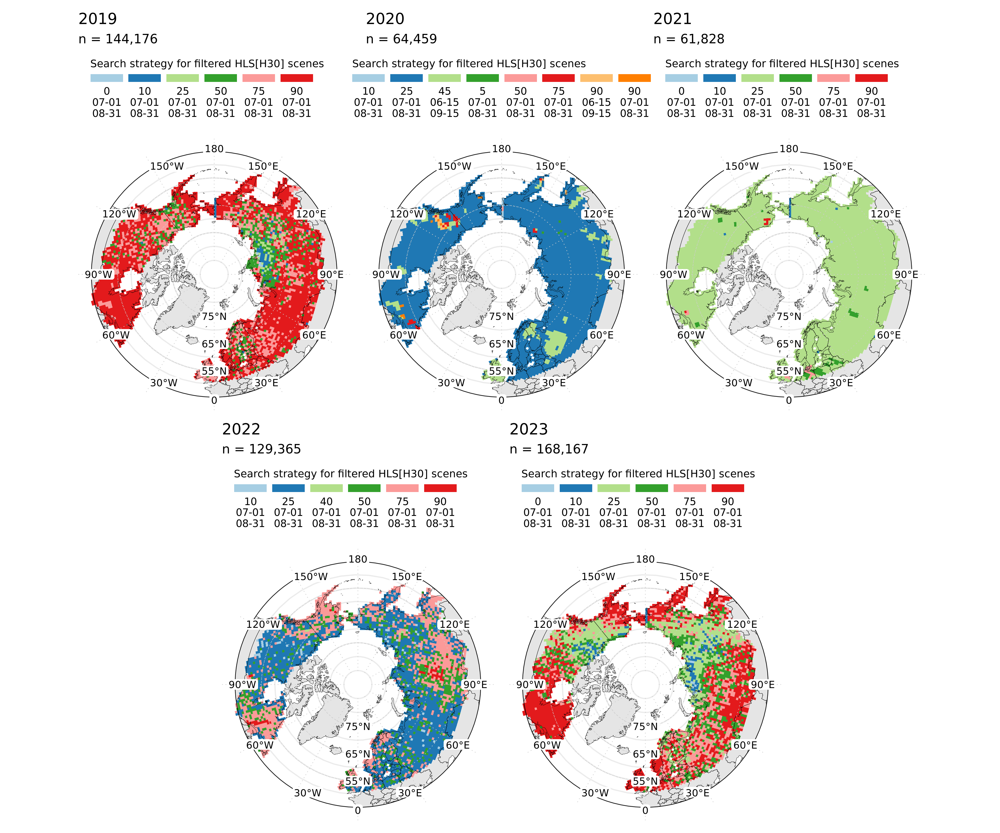

In [247]:
options(repr.plot.width = 12, repr.plot.height = 10, repr.plot.res = 300)

(
    (map_list[['2019']] | map_list[['2020']] | map_list[['2021']] ) /
    (map_list[['2022']] | map_list[['2023']] ) 
    #+ plot_annotation(tag_levels = "a") 
 ) #+ plot_layout(guides = "collect")

In [130]:
DATA_NAME_STEM = "boreal_tiles_DAAC_HLS_comp_multiplot"
EXPORT_TIME_STR = format(Sys.time(), "_%Y%m%d")

for(OUT_TYPE in c('png', 'pdf')){
    map_fn = path(OUT_FIGURE_DIR, paste0("map_",DATA_NAME_STEM,"_", EXPORT_TIME_STR,".", OUT_TYPE))
    print(map_fn)
    ggsave(plot = m_hls_multiplot,
           file = map_fn,
           device = OUT_TYPE, dpi = 300, width = 15, height = 8)
}

/projects/my-public-bucket/boreal_polar_map/paper_figs/map_boreal_tiles_DAAC_HLS_comp_multiplot__20230706.png
/projects/my-public-bucket/boreal_polar_map/paper_figs/map_boreal_tiles_DAAC_HLS_comp_multiplot__20230706.pdf


### Get from mscomp_metadata_gdf.ipynb

In [135]:
df_scenes = read_csv('/projects/my-public-bucket/boreal_polar_map/tables/mscomp_hls_scenes_smry.csv')
head(df_scenes)

Rows: 84209 Columns: 9

── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (4): id, start, end, HLS_type
dbl (5): count, properties.eo:cloud_cover, year, month, doy


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.



id,count,properties.eo:cloud_cover,year,start,end,HLS_type,month,doy
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>
HLS.L30.T01VCK.2020208T232307.v2.0,1,11,2020,07-01,09-01,L30,7,208
HLS.L30.T01VCK.2020224T232310.v2.0,1,29,2020,07-01,09-01,L30,8,224
HLS.L30.T01VCK.2021194T232306.v2.0,1,33,2021,07-01,09-01,L30,7,194
HLS.L30.T01VCL.2019230T231710.v2.0,2,37,2019,07-01,09-01,L30,8,230
HLS.L30.T01VCL.2019237T232259.v2.0,3,5,2019,07-01,09-01,L30,8,237
HLS.L30.T01VCL.2020208T232244.v2.0,3,6,2020,07-01,09-01,L30,7,208


/projects/my-public-bucket/boreal_polar_map/paper_figs/plot_mscomp_HLS_num_scenes_hist__20230706.png


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



/projects/my-public-bucket/boreal_polar_map/paper_figs/plot_mscomp_HLS_num_scenes_hist__20230706.pdf


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



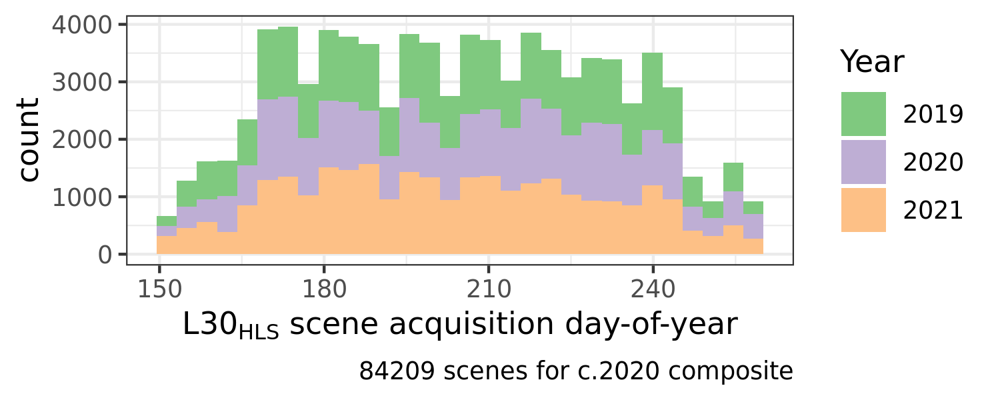

In [159]:
options(repr.plot.height = 2, repr.plot.width = 5, warn=-1)
p_doy_hist = ggplot(data = df_scenes) +
    geom_histogram(aes(x=doy, fill=as.factor(year)), position = position_stack() ) +
    #facet_grid('~year') +
    scale_fill_brewer(palette=1, type='qual') +
    labs(x=expression(L30[HLS]~"scene acquisition day-of-year"), fill='Year', caption=paste0(nrow(df_scenes), " scenes for c.2020 composite")) +
    theme_bw()

DATA_NAME_STEM = "mscomp_HLS_num_scenes_hist"
EXPORT_TIME_STR = format(Sys.time(), "_%Y%m%d")

for(OUT_TYPE in c('png', 'pdf')){
    map_fn = path(OUT_FIGURE_DIR, paste0("plot_",DATA_NAME_STEM,"_", EXPORT_TIME_STR,".", OUT_TYPE))
    print(map_fn)
    ggsave(plot = p_doy_hist,
           file = map_fn,
           device = OUT_TYPE, dpi = 150, width = 5, height = 2)
}

p_doy_hist

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



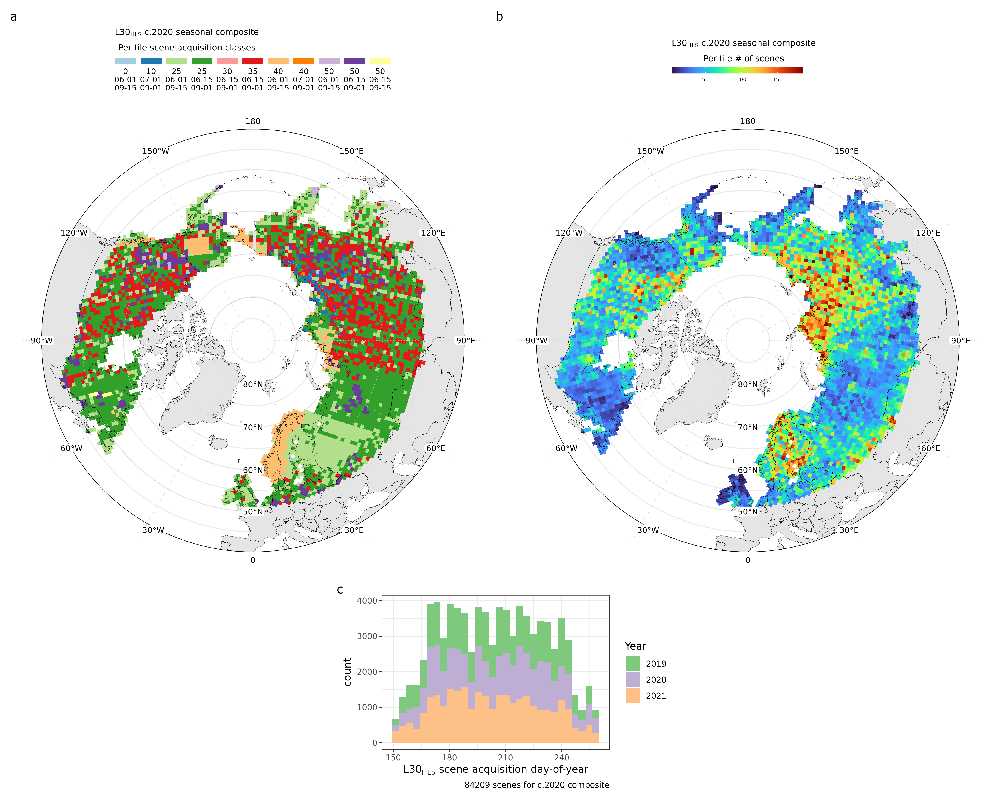

In [173]:
options(repr.plot.height = 12, repr.plot.width = 15, warn=-1)

layout = "
AAAABBBB
AAAABBBB
AAAABBBB
###CC###
"

m_hls_multiplot = m_hls_runname + m_boreal_tiles_HLS + p_doy_hist +
    plot_layout(design = layout) +
    plot_annotation(tag_levels = 'a') #+ theme(plot.tag = element_text(size = 26))

m_hls_multiplot

## Export figure: DAAC tiles - multiplot for c2020 composite

In [174]:
DATA_NAME_STEM = "boreal_tiles_DAAC_HLS_comp_multiplot"
EXPORT_TIME_STR = format(Sys.time(), "_%Y%m%d")

for(OUT_TYPE in c('png', 'pdf')){
    map_fn = path(OUT_FIGURE_DIR, paste0("map_",DATA_NAME_STEM,"_", EXPORT_TIME_STR,".", OUT_TYPE))
    print(map_fn)
    ggsave(plot = m_hls_multiplot,
           file = map_fn,
           device = OUT_TYPE, dpi = 300, width = 15, height = 12)
}

/projects/my-public-bucket/boreal_polar_map/paper_figs/map_boreal_tiles_DAAC_HLS_comp_multiplot__20230706.png


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



/projects/my-public-bucket/boreal_polar_map/paper_figs/map_boreal_tiles_DAAC_HLS_comp_multiplot__20230706.pdf


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



In [88]:
m_hls_maxcloud = DO_MAP_BOREAL_SP(MAP_EXTENT=ext,  
                     BOREAL_SHP_FN = wwf_circ_dis_fn,
                     LAYER_LIST = list(geom_polygon(data = boreal_tiles_gcs_HLS %>% dplyr::filter(tile_num %in% boreal_tile_num_DAAC_list), 
                                                    aes(x = long, y = lat, group = group, fill=max_cloud), size=0.1))
                    ) +
    theme(legend.text=element_text(size=rel(0.75))) +
    scale_fill_viridis(option='plasma', direction=-1) +
    guides(fill=guide_colourbar(title=expression("Per-tile scene acquisition cloudcover thresholds (%)"~L30[HLS]~" composite "), title.position = "top", label.position = "bottom", keywidth = unit(.5, "cm"), keyheight = unit(.25, "cm")))


OGR data source with driver: GeoJSON 
Source: "/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson", layer: "wwf_circumboreal_Dissolve"
with 2 features
It has 4 fields


Regions defined for each Polygons

Regions defined for each Polygons

Regions defined for each Polygons



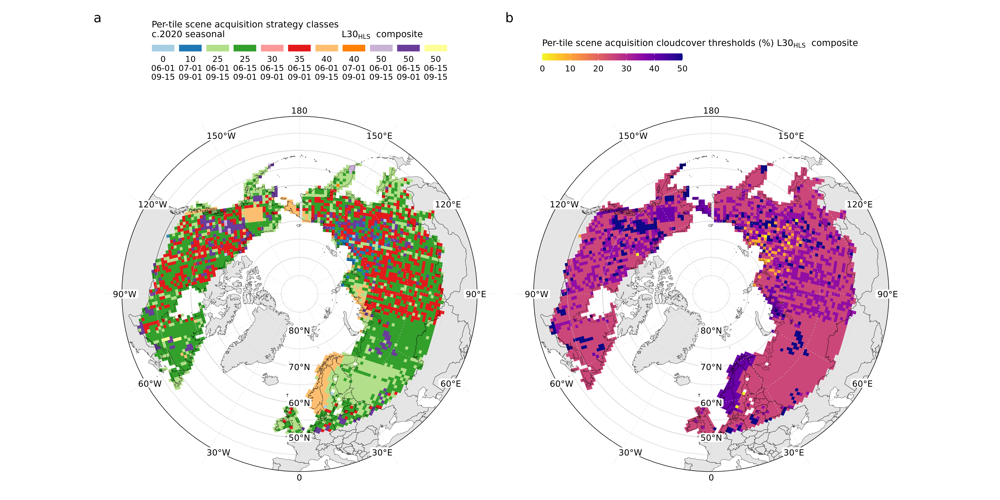

In [89]:
options(repr.plot.height = 7, repr.plot.width = 14, warn=-1)

layout = "
AB
"

m_hls_runname + m_hls_maxcloud +
    plot_layout(design = layout) +
    plot_annotation(tag_levels = 'a') #+ theme(plot.tag = element_text(size = 26))



OGR data source with driver: GeoJSON 
Source: "/projects/shared-buckets/nathanmthomas/analyze_agb/input_zones/wwf_circumboreal_Dissolve.geojson", layer: "wwf_circumboreal_Dissolve"
with 2 features
It has 4 fields


Regions defined for each Polygons

Regions defined for each Polygons

Regions defined for each Polygons



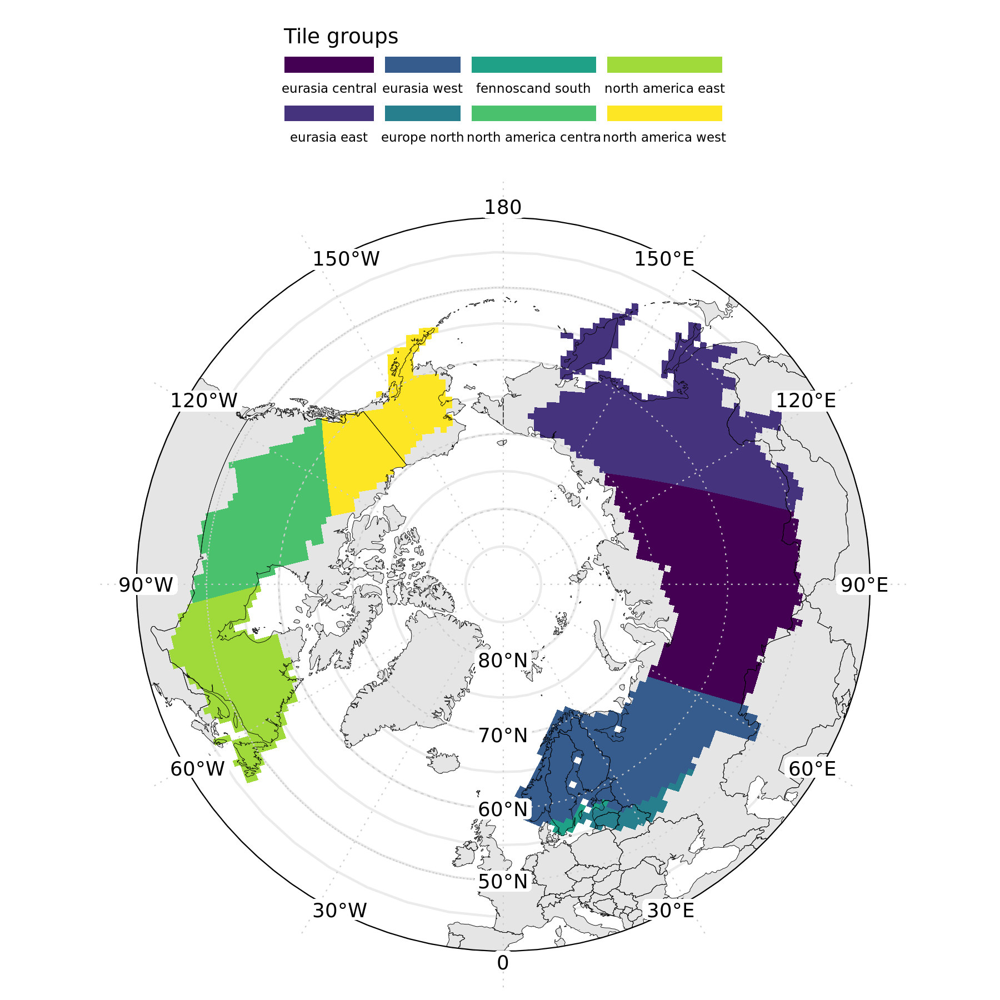

In [17]:
options(repr.plot.width = 6, repr.plot.height = 6, repr.plot.res = 300)

m_groups = DO_MAP_BOREAL_SP(MAP_EXTENT=ext,  
                     BOREAL_SHP_FN = wwf_circ_dis_fn,
                     LAYER_LIST = list(geom_polygon(data = boreal_tiles_gcs %>% dplyr::filter(tile_num %in% boreal_tile_num_list), 
                                                    aes(x = long, y = lat, group = group, fill=tile_group), size=0.1)) #, fill=NA
                    ) + 
    theme(legend.text=element_text(size=rel(0.5))) +
    #scale_color_brewer(palette = 'Set2') +
    scale_fill_viridis_d() +
    guides(fill=guide_legend(title="Tile groups", title.position = "top", label.position = "bottom", keywidth = unit(.5, "cm"), keyheight = unit(.25, "cm"), nrow=2))
m_groups
    


In [68]:
world <- crop(as(ne_countries(scale = "medium", returnclass = "sf"), 'Spatial'), ext)
head(world)

,scalerank,featurecla,labelrank,sovereignt,sov_a3,adm0_dif,level,type,admin,adm0_a3,⋯,adm0_a3_wb,continent,region_un,subregion,region_wb,name_len,long_len,abbrev_len,tiny,homepart
,<int>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,⋯,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,1,Admin-0 country,6,Albania,ALB,0,2,Sovereign country,Albania,ALB,⋯,NA,Europe,Europe,Southern Europe,Europe & Central Asia,7,7,4,NA,1
5,3,Admin-0 country,6,Finland,FI1,1,2,Country,Aland,ALD,⋯,NA,Europe,Europe,Northern Europe,Europe & Central Asia,5,13,5,5,NA
6,3,Admin-0 country,6,Andorra,AND,0,2,Sovereign country,Andorra,AND,⋯,NA,Europe,Europe,Southern Europe,Europe & Central Asia,7,7,4,5,1
9,1,Admin-0 country,6,Armenia,ARM,0,2,Sovereign country,Armenia,ARM,⋯,NA,Asia,Asia,Western Asia,Europe & Central Asia,7,7,4,NA,1
16,1,Admin-0 country,4,Austria,AUT,0,2,Sovereign country,Austria,AUT,⋯,NA,Europe,Europe,Western Europe,Europe & Central Asia,7,7,5,NA,1
17,1,Admin-0 country,5,Azerbaijan,AZE,0,2,Sovereign country,Azerbaijan,AZE,⋯,NA,Asia,Asia,Western Asia,Europe & Central Asia,10,10,4,NA,1


In [43]:
st_bbox(c(xmin = 16.1, xmax = 16.6, ymax = 48.6, ymin = 47.9), crs = st_crs(4326))

xmin ymin xmax ymax 
16.1 47.9 16.6 48.6 

In [ ]:
ne_countries(scale = "medium", returnclass = "sf") %>% st_make_valid()

Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”


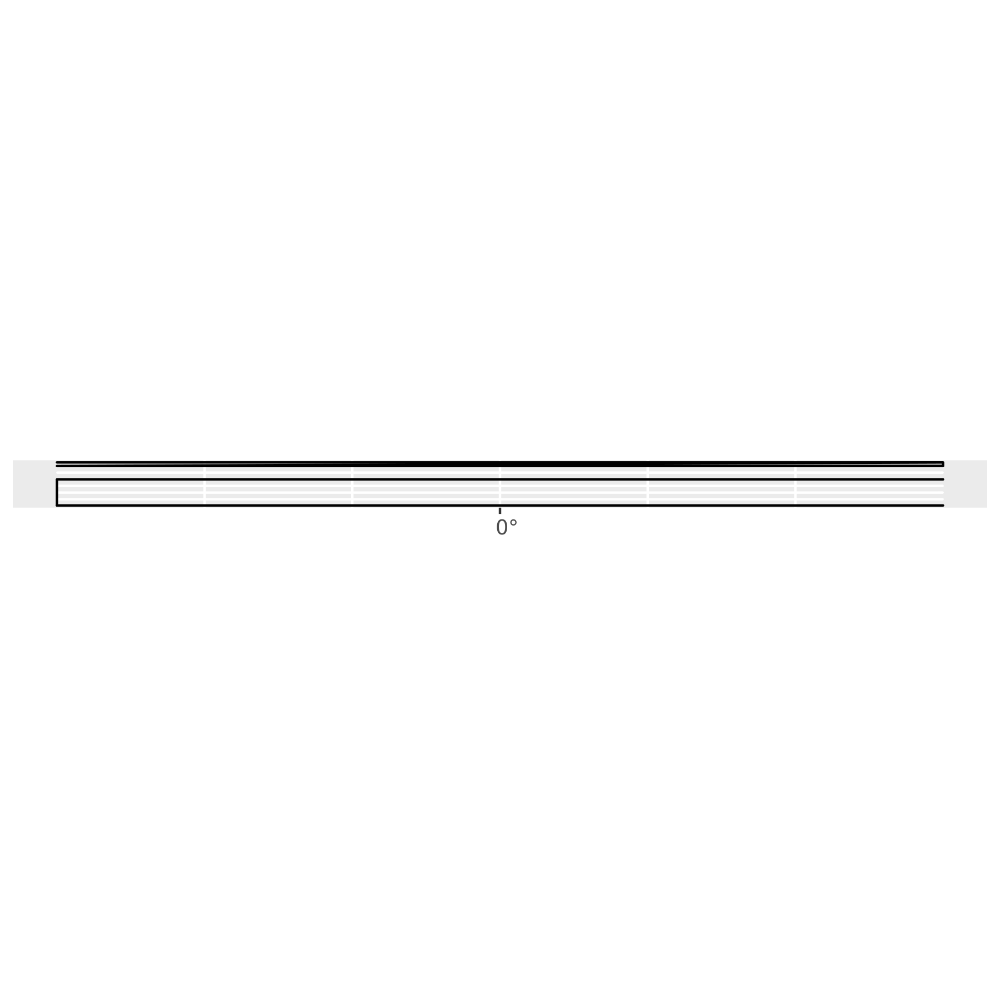

In [59]:
#world <- crop(ne_countries(scale = "medium", returnclass = "sp"), ext)
#world <- ne_countries(scale = "medium", returnclass = "sf") 
world = st_crop(x = ne_countries(scale = "medium", returnclass = "sf") %>% st_make_valid() , 
                #y = ext)
                y = st_as_sfc(st_bbox(c(xmin= ext[1], ymin = ext[3], xmax = ext[2], ymax = ext[4])), crs = 4326) )
ggplot(data = world, aes(group = admin)) +
  geom_sf(fill = "grey")